# Predict student performance in secondary education (high school).
From: https://archive-beta.ics.uci.edu/ml/datasets/student+performance

## Main operations carried out in previous versions:
1. Cleaned the data
2. Dummy encoded the categorical features
3. Simple Linear Regression: (mae, mse, r2) = (1.047997908821082, 3.2033972398230905, 0.7473179461540751)
4. Used all sklearn and xgb regression models for comparison, with default parameters. Lasso performed best with mae 0.89 and mse 3.07, both better than Simple Linear. Random Forest Regressor was a very close runners up with mae 0.97 and mse 2.99.
5. Used GridSearchCV with all models to find the best parameters, then predict and check score. Random Forest and Lasso turned out to be the top ones. XG Boost is very close behind.

## Main operations carried out in this notebook:
1. Artificial neural network using tensorflow and keras sequential model. Results are almost at par with the Random Forest model used in previous versions

In [1]:
# Attributes for both student-mat.csv (Math course) and student-por.csv (Portuguese language course) datasets:
# 1 school - student's school (binary: "GP" - Gabriel Pereira or "MS" - Mousinho da Silveira)
# 2 sex - student's sex (binary: "F" - female or "M" - male)
# 3 age - student's age (numeric: from 15 to 22)
# 4 address - student's home address type (binary: "U" - urban or "R" - rural)
# 5 famsize - family size (binary: "LE3" - less or equal to 3 or "GT3" - greater than 3)
# 6 Pstatus - parent's cohabitation status (binary: "T" - living together or "A" - apart)
# 7 Medu - mother's education (numeric: 0 - none,  1 - primary education (4th grade), 2 – 5th to 9th grade, 3 – secondary education or 4 – higher education)
# 8 Fedu - father's education (numeric: 0 - none,  1 - primary education (4th grade), 2 – 5th to 9th grade, 3 – secondary education or 4 – higher education)
# 9 Mjob - mother's job (nominal: "teacher", "health" care related, civil "services" (e.g. administrative or police), "at_home" or "other")
# 10 Fjob - father's job (nominal: "teacher", "health" care related, civil "services" (e.g. administrative or police), "at_home" or "other")
# 11 reason - reason to choose this school (nominal: close to "home", school "reputation", "course" preference or "other")
# 12 guardian - student's guardian (nominal: "mother", "father" or "other")
# 13 traveltime - home to school travel time (numeric: 1 - <15 min., 2 - 15 to 30 min., 3 - 30 min. to 1 hour, or 4 - >1 hour)
# 14 studytime - weekly study time (numeric: 1 - <2 hours, 2 - 2 to 5 hours, 3 - 5 to 10 hours, or 4 - >10 hours)
# 15 failures - number of past class failures (numeric: n if 1<=n<3, else 4)
# 16 schoolsup - extra educational support (binary: yes or no)
# 17 famsup - family educational support (binary: yes or no)
# 18 paid - extra paid classes within the course subject (Math or Portuguese) (binary: yes or no)
# 19 activities - extra-curricular activities (binary: yes or no)
# 20 nursery - attended nursery school (binary: yes or no)
# 21 higher - wants to take higher education (binary: yes or no)
# 22 internet - Internet access at home (binary: yes or no)
# 23 romantic - with a romantic relationship (binary: yes or no)
# 24 famrel - quality of family relationships (numeric: from 1 - very bad to 5 - excellent)
# 25 freetime - free time after school (numeric: from 1 - very low to 5 - very high)
# 26 goout - going out with friends (numeric: from 1 - very low to 5 - very high)
# 27 Dalc - workday alcohol consumption (numeric: from 1 - very low to 5 - very high)
# 28 Walc - weekend alcohol consumption (numeric: from 1 - very low to 5 - very high)
# 29 health - current health status (numeric: from 1 - very bad to 5 - very good)
# 30 absences - number of school absences (numeric: from 0 to 93)

# these grades are related with the course subject, Math or Portuguese:
# 31 G1 - first period grade (numeric: from 0 to 20)
# 31 G2 - second period grade (numeric: from 0 to 20)
# 32 G3 - final grade (numeric: from 0 to 20, output target)

In [2]:
# Setting the path for the two school datasets
path_mat = '/home/sandeep/Development/Datasets/Education/student/student-mat.csv'
path_por = '/home/sandeep/Development/Datasets/Education/student/student-por.csv'

In [3]:
# Loading the initial libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
# Reading the csv files into dataframes
df_mat = pd.read_csv(path_mat, sep=';')
df_por = pd.read_csv(path_por, sep=';')

In [5]:
# See all columns of dataframe in the notebook
pd.set_option('display.max_columns', None)

In [6]:
df_mat.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,3,yes,no,yes,no,yes,yes,yes,no,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,yes,yes,yes,yes,yes,yes,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,yes,no,yes,yes,no,no,4,3,2,1,2,5,4,6,10,10


In [7]:
df_por.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,fatherd,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,4,0,11,11
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,2,9,11,11
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,0,yes,no,no,no,yes,yes,yes,no,4,3,2,2,3,3,6,12,13,12
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,no,yes,yes,yes,yes,yes,3,2,2,1,1,5,0,14,14,14
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,no,no,yes,yes,no,no,4,3,2,1,2,5,0,11,13,13


In [8]:
# Check if columns of both datasets match
sum(list(df_mat.columns != df_por.columns))

1

In [9]:
# Find the column which is different
i = list(df_mat.columns == df_por.columns).index(False)
df_mat.columns[i], df_por.columns[i], i

('paid', 'fatherd', 17)

In [10]:
# Fix the column name that was a typo
df_por.rename(columns={'fatherd':'paid'}, inplace=True)
df_por.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,4,0,11,11
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,2,9,11,11
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,0,yes,no,no,no,yes,yes,yes,no,4,3,2,2,3,3,6,12,13,12
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,no,yes,yes,yes,yes,yes,3,2,2,1,1,5,0,14,14,14
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,no,no,yes,yes,no,no,4,3,2,1,2,5,0,11,13,13


In [11]:
sum(list(df_mat.columns != df_por.columns))

0

In [12]:
df_mat.shape, df_por.shape

((395, 33), (649, 33))

In [13]:
# Merge both the dataframes into a single file
df = pd.concat([df_mat, df_por], ignore_index=True)
df

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,3,yes,no,yes,no,yes,yes,yes,no,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,yes,yes,yes,yes,yes,yes,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,yes,no,yes,yes,no,no,4,3,2,1,2,5,4,6,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1039,MS,F,19,R,GT3,T,2,3,services,other,course,mother,1,3,1,no,no,no,yes,no,yes,yes,no,5,4,2,1,2,5,4,10,11,10
1040,MS,F,18,U,LE3,T,3,1,teacher,services,course,mother,1,2,0,no,yes,no,no,yes,yes,yes,no,4,3,4,1,1,1,4,15,15,16
1041,MS,F,18,U,GT3,T,1,1,other,other,course,mother,2,2,0,no,no,no,yes,yes,yes,no,no,1,1,1,1,1,5,6,11,12,9
1042,MS,M,17,U,LE3,T,3,1,services,services,course,mother,2,1,0,no,no,no,no,no,yes,yes,no,2,4,5,3,4,2,6,10,10,10


In [14]:
# Check for nan values
df.isnull().sum()

school        0
sex           0
age           0
address       0
famsize       0
Pstatus       0
Medu          0
Fedu          0
Mjob          0
Fjob          0
reason        0
guardian      0
traveltime    0
studytime     0
failures      0
schoolsup     0
famsup        0
paid          0
activities    0
nursery       0
higher        0
internet      0
romantic      0
famrel        0
freetime      0
goout         0
Dalc          0
Walc          0
health        0
absences      0
G1            0
G2            0
G3            0
dtype: int64

In [15]:
# Select all columns
columns_all = df.columns
columns_all

Index(['school', 'sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
       'Mjob', 'Fjob', 'reason', 'guardian', 'traveltime', 'studytime',
       'failures', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery',
       'higher', 'internet', 'romantic', 'famrel', 'freetime', 'goout', 'Dalc',
       'Walc', 'health', 'absences', 'G1', 'G2', 'G3'],
      dtype='object')

In [16]:
df.head(1)

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,6,5,6,6


In [17]:
# Check dtype of all columns
df.dtypes

school        object
sex           object
age            int64
address       object
famsize       object
Pstatus       object
Medu           int64
Fedu           int64
Mjob          object
Fjob          object
reason        object
guardian      object
traveltime     int64
studytime      int64
failures       int64
schoolsup     object
famsup        object
paid          object
activities    object
nursery       object
higher        object
internet      object
romantic      object
famrel         int64
freetime       int64
goout          int64
Dalc           int64
Walc           int64
health         int64
absences       int64
G1             int64
G2             int64
G3             int64
dtype: object

In [40]:
# Select the categorical columns
columns_cat = df.select_dtypes(include=['object']).columns
columns_cat

Index(['school', 'sex', 'address', 'famsize', 'Pstatus', 'Mjob', 'Fjob',
       'reason', 'guardian', 'schoolsup', 'famsup', 'paid', 'activities',
       'nursery', 'higher', 'internet', 'romantic'],
      dtype='object')

In [41]:
# Select the numerical columns
columns_num = [col for col in columns_all if col not in columns_cat]
columns_num

['age',
 'Medu',
 'Fedu',
 'traveltime',
 'studytime',
 'failures',
 'famrel',
 'freetime',
 'goout',
 'Dalc',
 'Walc',
 'health',
 'absences',
 'G1',
 'G2',
 'G3']

Alert! from version 0.1.41, after importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Updated: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
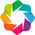

Shape of your Data Set loaded: (1044, 34)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    34 Predictors classified...
        1 variables removed since they were ID or low-information variables
16 numeric variables in data exceeds limit, taking top 30 variables
Number of All Scatter Plots = 136


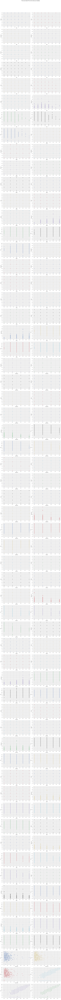

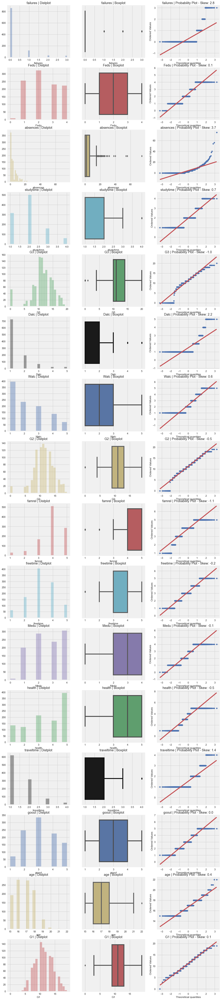

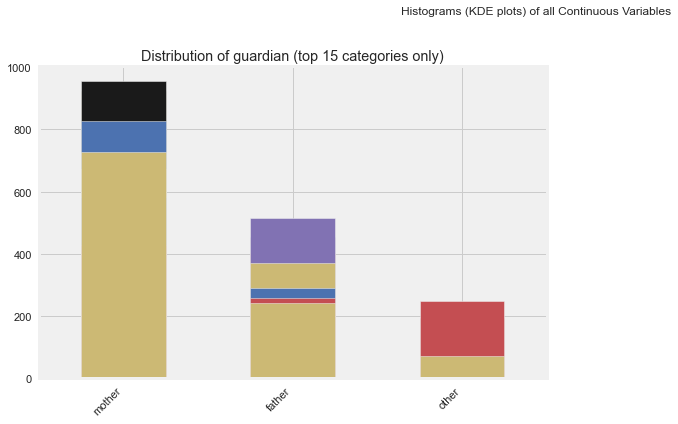

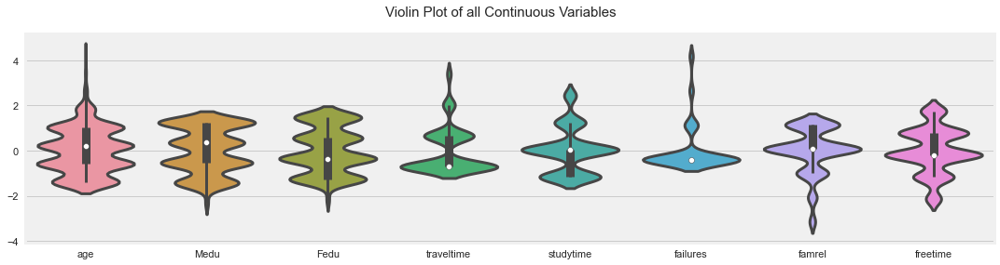

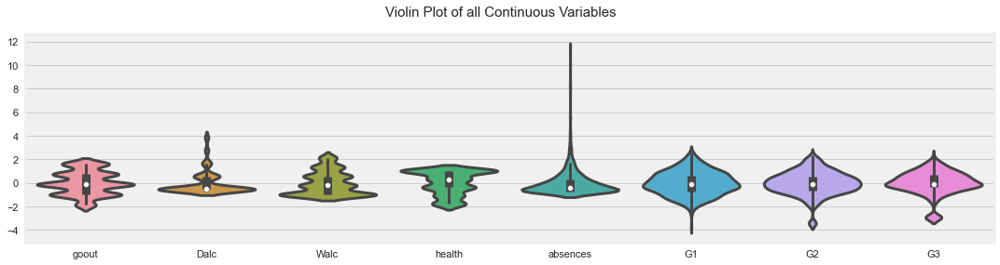

Could not draw Violin Plot


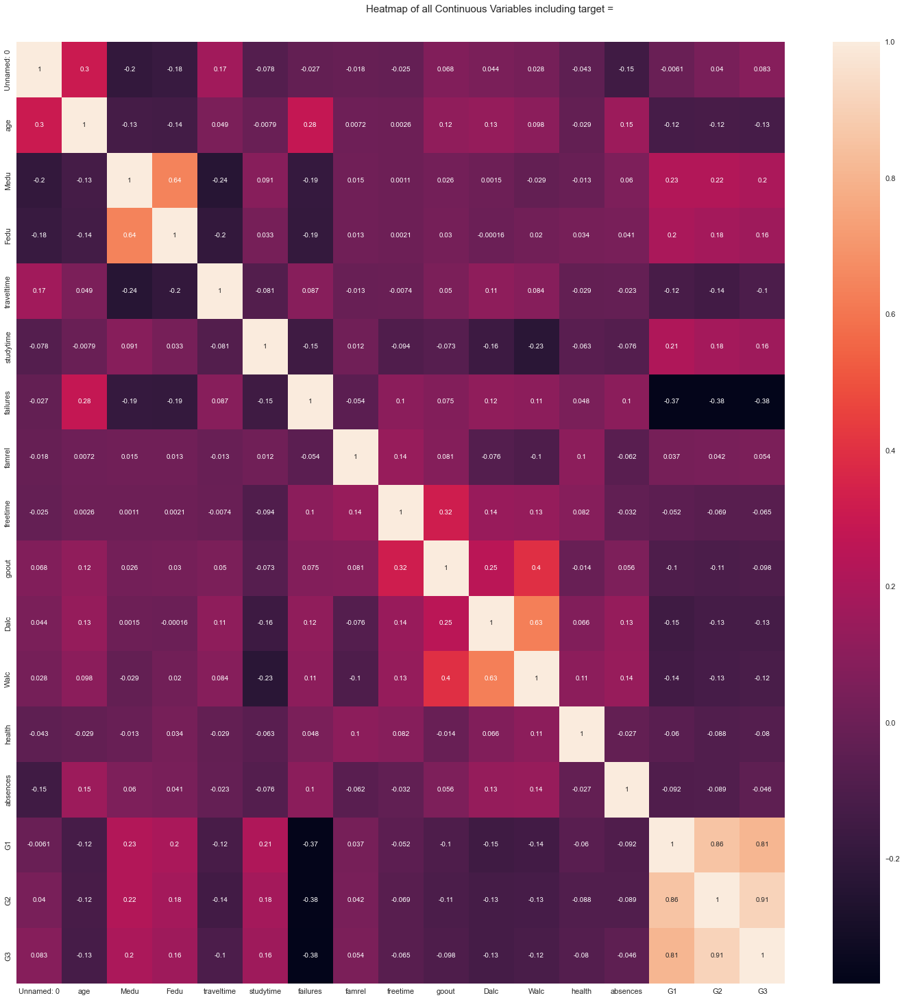

Time to run AutoViz = 161 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [20]:
# Let's use the Autoviz module for visualization
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline
df.to_csv('temp.csv')
filename = 'temp.csv'
AV = AutoViz_Class()
dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)

In [87]:
df.head(10)

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,3,yes,no,yes,no,yes,yes,yes,no,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,yes,yes,yes,yes,yes,yes,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,yes,no,yes,yes,no,no,4,3,2,1,2,5,4,6,10,10
5,GP,M,16,U,LE3,T,4,3,services,other,reputation,mother,1,2,0,no,yes,yes,yes,yes,yes,yes,no,5,4,2,1,2,5,10,15,15,15
6,GP,M,16,U,LE3,T,2,2,other,other,home,mother,1,2,0,no,no,no,no,yes,yes,yes,no,4,4,4,1,1,3,0,12,12,11
7,GP,F,17,U,GT3,A,4,4,other,teacher,home,mother,2,2,0,yes,yes,no,no,yes,yes,no,no,4,1,4,1,1,1,6,6,5,6
8,GP,M,15,U,LE3,A,3,2,services,other,home,mother,1,2,0,no,yes,yes,no,yes,yes,yes,no,4,2,2,1,1,1,0,16,18,19
9,GP,M,15,U,GT3,T,3,4,other,other,home,mother,1,2,0,no,yes,yes,yes,yes,yes,yes,no,5,5,1,1,1,5,0,14,15,15


In [107]:
# We observe that the numerical columns are not scaled properly, however, because variance is low and data is small, we'll not do scaling
# Also the categorical columns need to be encoded

In [88]:
# Encode the categorical columns using dummies
df_encoded = pd.get_dummies(df, columns=columns_cat, drop_first=True)
df_encoded

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3,school_MS,sex_M,address_U,famsize_LE3,Pstatus_T,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_home,reason_other,reason_reputation,guardian_mother,guardian_other,schoolsup_yes,famsup_yes,paid_yes,activities_yes,nursery_yes,higher_yes,internet_yes,romantic_yes
0,18,4,4,2,2,0,4,3,4,1,1,3,6,5,6,6,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0
1,17,1,1,1,2,0,5,3,3,1,1,3,4,5,5,6,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0
2,15,1,1,1,2,3,4,3,2,2,3,3,10,7,8,10,0,0,1,1,1,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,1,0,1,1,1,0
3,15,4,2,1,3,0,3,2,2,1,1,5,2,15,14,15,0,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,1,0,0,1,1,1,1,1,1,1
4,16,3,3,1,2,0,4,3,2,1,2,5,4,6,10,10,0,0,1,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1039,19,2,3,1,3,1,5,4,2,1,2,5,4,10,11,10,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0
1040,18,3,1,1,2,0,4,3,4,1,1,1,4,15,15,16,1,0,1,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,1,1,0
1041,18,1,1,2,2,0,1,1,1,1,1,5,6,11,12,9,1,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,1,0,0
1042,17,3,1,2,1,0,2,4,5,3,4,2,6,10,10,10,1,1,1,1,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0


In [89]:
# Select the features column for the model
X = df_encoded.drop('G3', axis=1)
X.head()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,school_MS,sex_M,address_U,famsize_LE3,Pstatus_T,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_home,reason_other,reason_reputation,guardian_mother,guardian_other,schoolsup_yes,famsup_yes,paid_yes,activities_yes,nursery_yes,higher_yes,internet_yes,romantic_yes
0,18,4,4,2,2,0,4,3,4,1,1,3,6,5,6,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0
1,17,1,1,1,2,0,5,3,3,1,1,3,4,5,5,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0
2,15,1,1,1,2,3,4,3,2,2,3,3,10,7,8,0,0,1,1,1,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,1,0,1,1,1,0
3,15,4,2,1,3,0,3,2,2,1,1,5,2,15,14,0,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,1,0,0,1,1,1,1,1,1,1
4,16,3,3,1,2,0,4,3,2,1,2,5,4,6,10,0,0,1,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0


In [90]:
# Select the target column for the model
y = df_encoded['G3']
y.head()

0     6
1     6
2    10
3    15
4    10
Name: G3, dtype: int64

In [91]:
# Split the data into training and testing
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [99]:
# Import all needed libraries and sublibraries for ANN

import tensorflow as tf
from tensorflow.keras import regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.metrics import r2_score, mean_absolute_error as mae, mean_squared_error as mse

import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

Epoch 1/100
21/21 [==============================] - 2s 39ms/step - loss: 161.8571 - mean_absolute_error: 12.0369 - val_loss: 106.4114 - val_mean_absolute_error: 9.6941
Epoch 2/100
21/21 [==============================] - 0s 19ms/step - loss: 91.3503 - mean_absolute_error: 9.0061 - val_loss: 54.6381 - val_mean_absolute_error: 6.8779
Epoch 3/100
21/21 [==============================] - 0s 23ms/step - loss: 41.8402 - mean_absolute_error: 5.9582 - val_loss: 26.9632 - val_mean_absolute_error: 4.5911
Epoch 4/100
21/21 [==============================] - 1s 27ms/step - loss: 20.5256 - mean_absolute_error: 3.9019 - val_loss: 14.5831 - val_mean_absolute_error: 3.0572
Epoch 5/100
21/21 [==============================] - 0s 22ms/step - loss: 10.9555 - mean_absolute_error: 2.5108 - val_loss: 11.5691 - val_mean_absolute_error: 2.5259
Epoch 6/100
21/21 [==============================] - 0s 23ms/step - loss: 7.9262 - mean_absolute_error: 2.0673 - val_loss: 10.9145 - val_mean_absolute_error: 2.4128
Ep

21/21 [==============================] - 1s 30ms/step - loss: 2.4403 - mean_absolute_error: 1.0384 - val_loss: 2.5279 - val_mean_absolute_error: 1.0213
Epoch 51/100
21/21 [==============================] - 0s 23ms/step - loss: 1.8613 - mean_absolute_error: 0.9330 - val_loss: 2.5303 - val_mean_absolute_error: 1.0219
Epoch 52/100
21/21 [==============================] - 1s 25ms/step - loss: 2.3373 - mean_absolute_error: 0.9933 - val_loss: 2.5229 - val_mean_absolute_error: 1.0240
Epoch 53/100
21/21 [==============================] - 1s 26ms/step - loss: 2.1826 - mean_absolute_error: 0.9992 - val_loss: 2.5710 - val_mean_absolute_error: 1.0522
Epoch 54/100
21/21 [==============================] - 0s 24ms/step - loss: 2.0853 - mean_absolute_error: 0.9831 - val_loss: 2.5779 - val_mean_absolute_error: 1.0584
Epoch 55/100
21/21 [==============================] - 0s 21ms/step - loss: 2.3781 - mean_absolute_error: 1.0087 - val_loss: 2.4677 - val_mean_absolute_error: 1.0088
Epoch 56/100
21/21 [===

21/21 [==============================] - 1s 28ms/step - loss: 4.5809 - mean_absolute_error: 1.2740 - val_loss: 3.8373 - val_mean_absolute_error: 1.2139
Epoch 4/100
21/21 [==============================] - 1s 26ms/step - loss: 3.7594 - mean_absolute_error: 1.1993 - val_loss: 3.3122 - val_mean_absolute_error: 1.1048
Epoch 5/100
21/21 [==============================] - 1s 28ms/step - loss: 3.2226 - mean_absolute_error: 1.1306 - val_loss: 3.0918 - val_mean_absolute_error: 1.1331
Epoch 6/100
21/21 [==============================] - 0s 24ms/step - loss: 3.0217 - mean_absolute_error: 1.0665 - val_loss: 2.9117 - val_mean_absolute_error: 1.0501
Epoch 7/100
21/21 [==============================] - 1s 28ms/step - loss: 2.6560 - mean_absolute_error: 1.0340 - val_loss: 2.7304 - val_mean_absolute_error: 1.0370
Epoch 8/100
21/21 [==============================] - 1s 30ms/step - loss: 2.8770 - mean_absolute_error: 1.0531 - val_loss: 2.6781 - val_mean_absolute_error: 1.0176
Epoch 9/100
21/21 [=========

21/21 [==============================] - 1s 33ms/step - loss: 242.9802 - mean_absolute_error: 15.0912 - val_loss: 203.4076 - val_mean_absolute_error: 13.6630
Epoch 23/100
21/21 [==============================] - 1s 32ms/step - loss: 198.1139 - mean_absolute_error: 13.5406 - val_loss: 166.2647 - val_mean_absolute_error: 12.2284
Epoch 24/100
21/21 [==============================] - 1s 36ms/step - loss: 160.9898 - mean_absolute_error: 12.0840 - val_loss: 135.5529 - val_mean_absolute_error: 10.9451
Epoch 25/100
21/21 [==============================] - 1s 27ms/step - loss: 131.9394 - mean_absolute_error: 10.8628 - val_loss: 110.5588 - val_mean_absolute_error: 9.8909
Epoch 26/100
21/21 [==============================] - 1s 30ms/step - loss: 105.6242 - mean_absolute_error: 9.7765 - val_loss: 90.1690 - val_mean_absolute_error: 8.9212
Epoch 27/100
21/21 [==============================] - 1s 28ms/step - loss: 88.4555 - mean_absolute_error: 8.8517 - val_loss: 73.9264 - val_mean_absolute_error: 8.

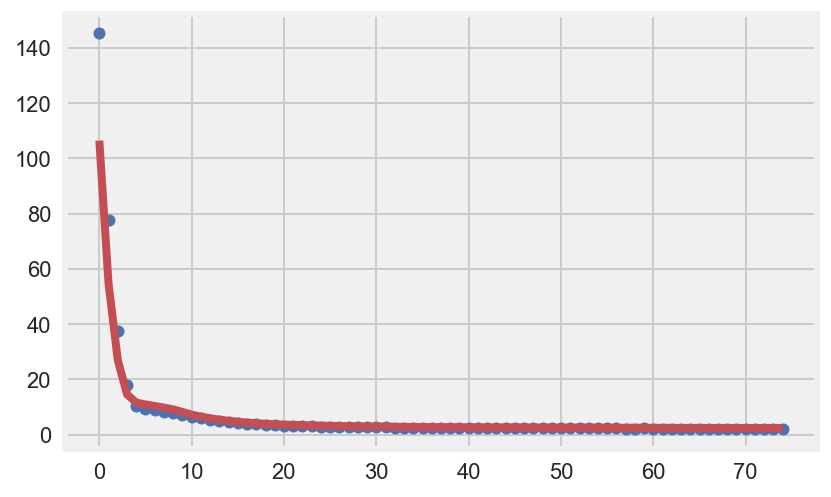

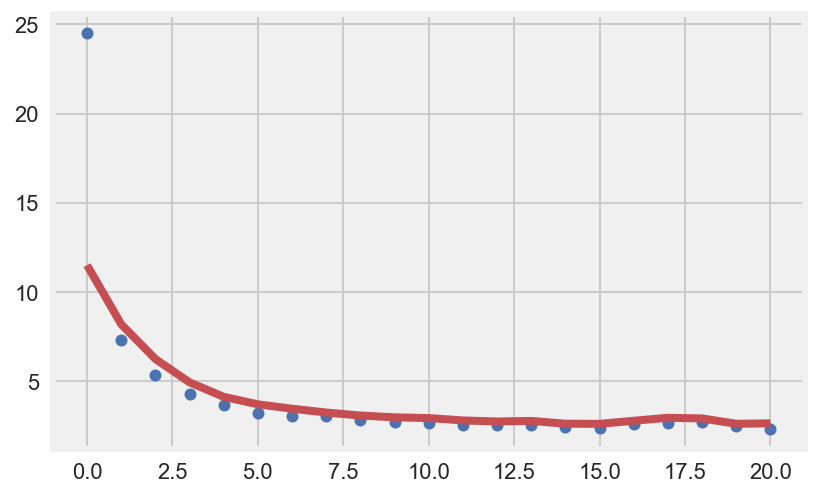

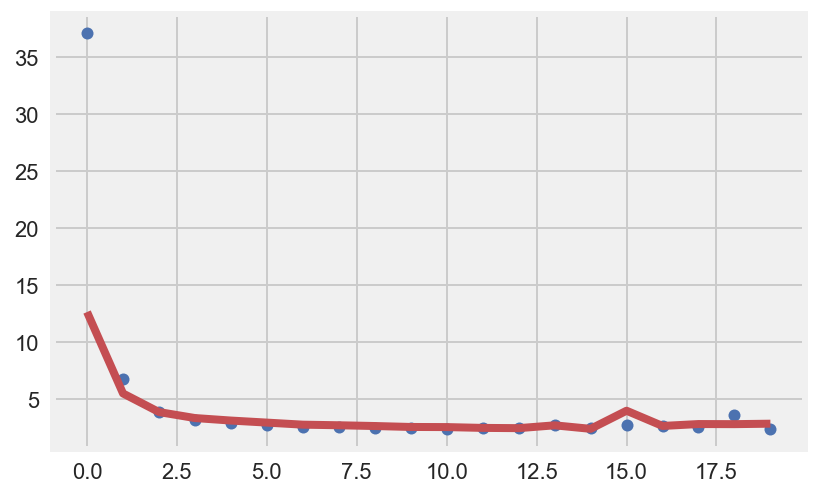

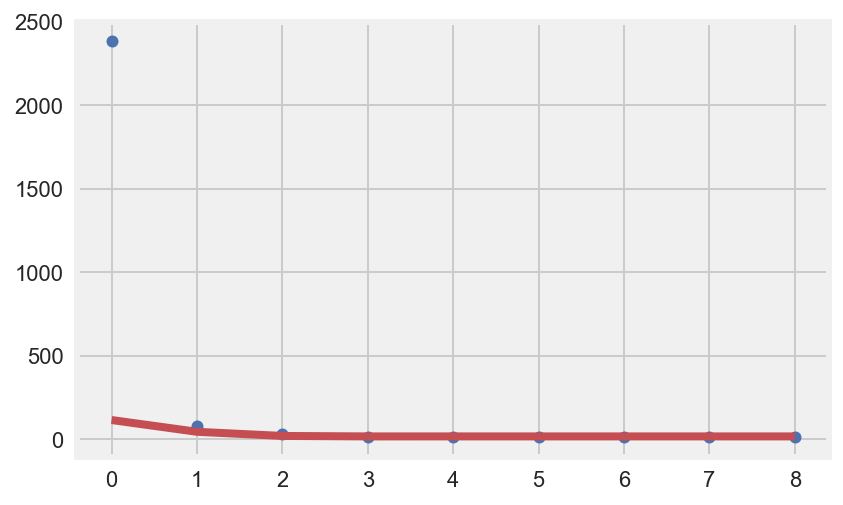

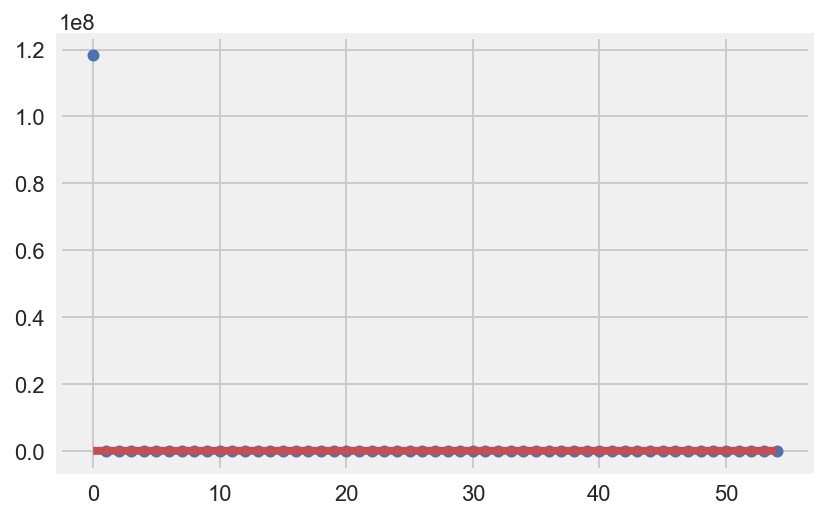

In [108]:
# Plots the results of a different learning rates for simple sequential model with 1 hidden layer

LR = [0.001, 0.01, 0.1, 1, 10]

for i in LR:
    #Define keras sequential model and its structure
    model = Sequential()
    model.add(Dense(16, input_shape=(41,), activation = 'relu'))
    model.add(Dense(1,))
    
    #Compile model
    model.compile(Adam(lr=i), loss='mean_squared_error', metrics=['mean_absolute_error'])
    
    # Instantiate 'EarlyStopping' function
    earlystopper = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto')

    # Fits model over 100 iterations with 'earlystopper' callback, and assigns it to history
    history = model.fit(X_train, y_train, epochs = 100, validation_split = 0.2,shuffle = True, verbose = 1, 
                    callbacks = [earlystopper])
    history_dict=history.history
    
    #Plot model's training loss and validation loss to check fitting
    loss_values = history_dict['loss']
    val_loss_values=history_dict['val_loss']
    plt.figure()
    plt.plot(loss_values,'bo',label='training loss')
    plt.plot(val_loss_values,'r',label='val training loss')

Epoch 1/100
21/21 [==============================] - 2s 46ms/step - loss: 75.8873 - mean_absolute_error: 8.1457 - val_loss: 26.7034 - val_mean_absolute_error: 4.5936
Epoch 2/100
21/21 [==============================] - 1s 29ms/step - loss: 17.3486 - mean_absolute_error: 3.4179 - val_loss: 15.7507 - val_mean_absolute_error: 2.6652
Epoch 3/100
21/21 [==============================] - 1s 27ms/step - loss: 10.6008 - mean_absolute_error: 2.2740 - val_loss: 9.8784 - val_mean_absolute_error: 2.1893
Epoch 4/100
21/21 [==============================] - 1s 26ms/step - loss: 6.8719 - mean_absolute_error: 1.8957 - val_loss: 7.9872 - val_mean_absolute_error: 1.7977
Epoch 5/100
21/21 [==============================] - 1s 30ms/step - loss: 5.0670 - mean_absolute_error: 1.5533 - val_loss: 6.0324 - val_mean_absolute_error: 1.5591
Epoch 6/100
21/21 [==============================] - 1s 28ms/step - loss: 4.4291 - mean_absolute_error: 1.4284 - val_loss: 4.8795 - val_mean_absolute_error: 1.4008
Epoch 7/100

Epoch 51/100
21/21 [==============================] - 1s 35ms/step - loss: 1.5862 - mean_absolute_error: 0.8072 - val_loss: 1.9008 - val_mean_absolute_error: 0.8924
Epoch 52/100
21/21 [==============================] - 1s 38ms/step - loss: 1.8721 - mean_absolute_error: 0.8706 - val_loss: 1.8998 - val_mean_absolute_error: 0.9221
Epoch 53/100
21/21 [==============================] - 1s 31ms/step - loss: 1.7573 - mean_absolute_error: 0.8547 - val_loss: 2.1987 - val_mean_absolute_error: 1.0427
Epoch 54/100
21/21 [==============================] - 1s 46ms/step - loss: 1.8480 - mean_absolute_error: 0.8556 - val_loss: 1.8704 - val_mean_absolute_error: 0.8973
Epoch 55/100
21/21 [==============================] - 1s 45ms/step - loss: 1.9879 - mean_absolute_error: 0.8950 - val_loss: 1.8807 - val_mean_absolute_error: 0.9195
Epoch 56/100
21/21 [==============================] - 1s 37ms/step - loss: 1.9023 - mean_absolute_error: 0.9095 - val_loss: 1.8337 - val_mean_absolute_error: 0.8828
Epoch 57/1

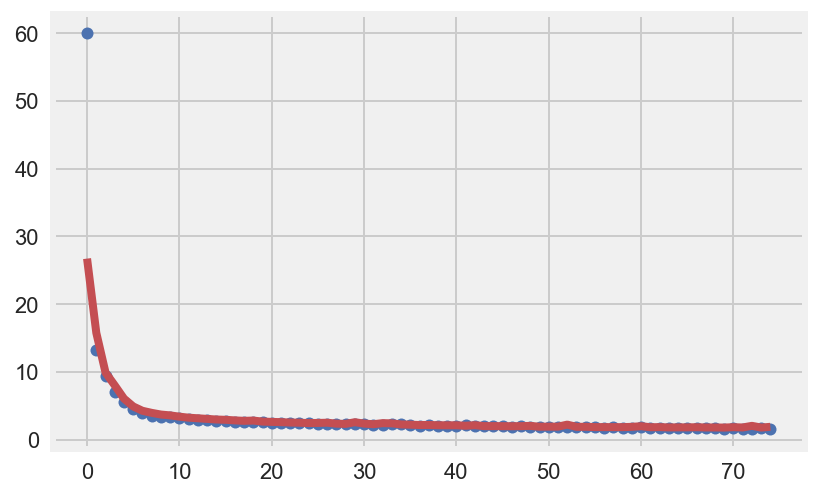

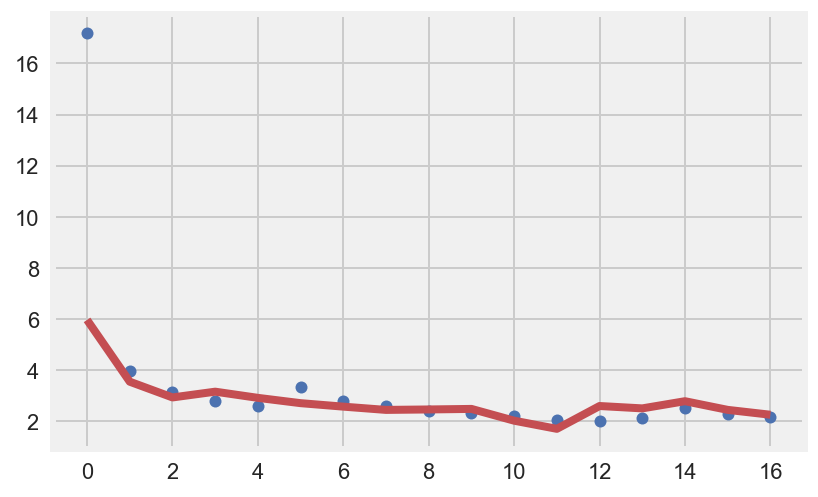

In [109]:
# Now we will use a fine tuned learning rate and a deeper neural network
LR = [0.001, 0.01]

for i in LR:
    #Define keras sequential model and its structure
    model = Sequential()
    model.add(Dense(16, input_shape=(41,), activation = 'relu'))
    model.add(Dense(16, activation = 'relu'))
    model.add(Dense(16, activation = 'relu'))
    model.add(Dense(16, activation = 'relu'))
    model.add(Dense(1,))
    
    #Compile model
    model.compile(Adam(lr=i), loss='mean_squared_error', metrics=['mean_absolute_error'])
    
    # Instantiate 'EarlyStopping' function
    earlystopper = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto')

    # Fits model over 100 iterations with 'earlystopper' callback, and assigns it to history
    history = model.fit(X_train, y_train, epochs = 100, validation_split = 0.2,shuffle = True, verbose = 1, 
                    callbacks = [earlystopper])
    history_dict=history.history
    
    #Plot model's training loss and validation loss to check fitting
    loss_values = history_dict['loss']
    val_loss_values=history_dict['val_loss']
    plt.figure()
    plt.plot(loss_values,'bo',label='training loss')
    plt.plot(val_loss_values,'r',label='val training loss')

Epoch 1/100
21/21 [==============================] - 2s 42ms/step - loss: 145.7676 - mean_absolute_error: 11.4635 - val_loss: 62.3895 - val_mean_absolute_error: 7.3983
Epoch 2/100
21/21 [==============================] - 1s 31ms/step - loss: 47.2263 - mean_absolute_error: 6.1796 - val_loss: 14.0503 - val_mean_absolute_error: 2.3934
Epoch 3/100
21/21 [==============================] - 0s 21ms/step - loss: 9.9626 - mean_absolute_error: 2.2296 - val_loss: 11.1365 - val_mean_absolute_error: 2.2404
Epoch 4/100
21/21 [==============================] - 1s 23ms/step - loss: 8.3148 - mean_absolute_error: 2.0496 - val_loss: 9.8358 - val_mean_absolute_error: 2.1136
Epoch 5/100
21/21 [==============================] - 1s 25ms/step - loss: 8.0752 - mean_absolute_error: 1.9896 - val_loss: 9.0295 - val_mean_absolute_error: 1.9787
Epoch 6/100
21/21 [==============================] - 1s 26ms/step - loss: 7.0350 - mean_absolute_error: 1.8441 - val_loss: 8.1761 - val_mean_absolute_error: 1.8936
Epoch 7/1

Epoch 51/100
21/21 [==============================] - 1s 28ms/step - loss: 1.6701 - mean_absolute_error: 0.8991 - val_loss: 1.9603 - val_mean_absolute_error: 0.9390
Epoch 52/100
21/21 [==============================] - 1s 29ms/step - loss: 1.6830 - mean_absolute_error: 0.8768 - val_loss: 2.0349 - val_mean_absolute_error: 0.9877
Epoch 53/100
21/21 [==============================] - 1s 33ms/step - loss: 1.9434 - mean_absolute_error: 0.9461 - val_loss: 1.9297 - val_mean_absolute_error: 0.9273
Epoch 54/100
21/21 [==============================] - 1s 32ms/step - loss: 2.0667 - mean_absolute_error: 0.9392 - val_loss: 1.9528 - val_mean_absolute_error: 0.9255
Epoch 55/100
21/21 [==============================] - 1s 33ms/step - loss: 1.7006 - mean_absolute_error: 0.8709 - val_loss: 1.8736 - val_mean_absolute_error: 0.9185
Epoch 56/100
21/21 [==============================] - 1s 34ms/step - loss: 1.9938 - mean_absolute_error: 0.9452 - val_loss: 1.9630 - val_mean_absolute_error: 0.9367
Epoch 57/1

<Figure size 432x288 with 0 Axes>

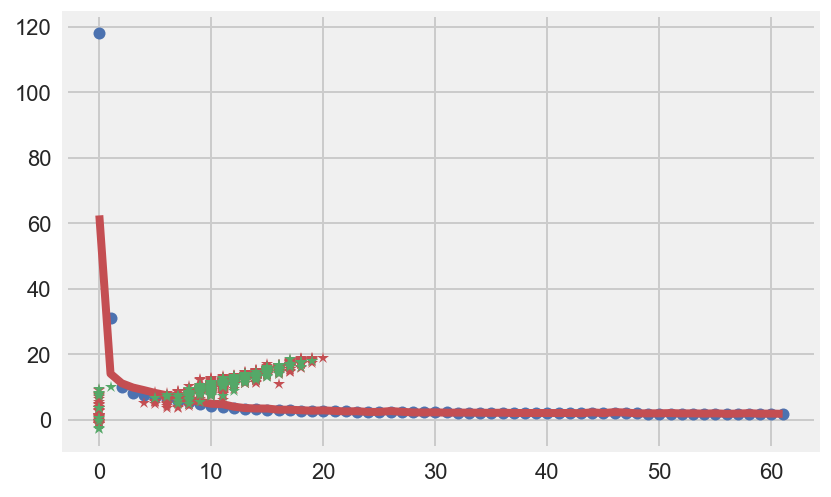

<Figure size 432x288 with 0 Axes>

In [111]:
# Now we will fix learning rate at 0.001 make predictions and check performance

#Define keras sequential model and its structure
model = Sequential()
model.add(Dense(16, input_shape=(41,), activation = 'relu'))
model.add(Dense(16, activation = 'relu'))
model.add(Dense(16, activation = 'relu'))
model.add(Dense(16, activation = 'relu'))
model.add(Dense(1,))

#Compile model
model.compile(Adam(lr=0.001), loss='mean_squared_error', metrics=['mean_absolute_error'])

# Instantiate 'EarlyStopping' function
earlystopper = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto')

# Fits model over 100 iterations with 'earlystopper' callback, and assigns it to history
history = model.fit(X_train, y_train, epochs = 100, validation_split = 0.2,shuffle = True, verbose = 1, 
                callbacks = [earlystopper])
history_dict=history.history

#Plot model's training loss and validation loss to check fitting
loss_values = history_dict['loss']
val_loss_values=history_dict['val_loss']
plt.figure()
plt.plot(loss_values,'bo',label='training loss')
plt.plot(val_loss_values,'r',label='val training loss')

# Make predictions with current weights on the training and testing data
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Calculate and prints performance metrics
print(f"R2_Train:\t{r2_score(y_train, y_train_pred):0.2f}")
print(f"MAE_Train:\t{mae(y_train, y_train_pred):0.2f}")
print(f"MSE_Train:\t{mse(y_train, y_train_pred):0.2f}")
print(f"R2_Test:\t{r2_score(y_test, y_test_pred):0.2f}")
print(f"MAE_Test:\t{mae(y_test, y_test_pred):0.2f}")
print(f"MSE_Test:\t{mse(y_test, y_test_pred):0.2f}")

plt.plot(y_train, y_train_pred,'*r')
plt.plot(y_test, y_test_pred, '*g')
plt.figure()

## Achieved R2 0.81 MAE 1 and MSE 2.87 using neural networks, which is slightly better than or almost at par with the Random Forest model results arrived at in previous verisons